In [1]:
try:
    from google.colab import drive
    drive.mount('/content/drive')
    %cd /content/drive/MyDrive/kaggle/birdclef-2022
    
    #### Download packages if in Google Colab
    colab_requirements = [
        "pip install librosa",
        "pip install noisereduce",
        "pip install soundfile",
    ]

    import sys, subprocess

    def run_subprocess_command(cmd):
        # run the command
        process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
        # print the output
        for line in process.stdout:
            print(line.decode().strip())

    IN_COLAB = "google.colab" in sys.modules
    if IN_COLAB:
        for i in colab_requirements:
            run_subprocess_command(i)
except:
    print("Not in Colab")

Not in Colab


In [2]:
# !unzip birdclef-2022.zip -d birdclef-2022

In [3]:
import os
import pandas as pd

DATA_PATH = r'birdclef-2022'
TRAIN_DATA_PATH = os.path.join(DATA_PATH, 'train_audio')

train_df = pd.read_csv(os.path.join(DATA_PATH, 'train_metadata.csv'))
train_df

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14847,zebdov,[],"['adult', 'song']",22.6499,120.2872,Geopelia striata,Zebra Dove,Jerome Chie-Jen Ko,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:36,https://www.xeno-canto.org/629769,zebdov/XC629769.ogg
14848,zebdov,[],"['adult', 'sex uncertain', 'song']",1.4168,103.7287,Geopelia striata,Zebra Dove,Kim Chuah Lim,Creative Commons Attribution-NonCommercial-Sha...,4.0,08:00,https://www.xeno-canto.org/642415,zebdov/XC642415.ogg
14849,zebdov,[],"['adult', 'call', 'sex uncertain']",1.4347,103.7043,Geopelia striata,Zebra Dove,Kim Chuah Lim,Creative Commons Attribution-NonCommercial-Sha...,4.0,09:00,https://www.xeno-canto.org/665873,zebdov/XC665873.ogg
14850,zebdov,[],['song'],3.3508,101.2451,Geopelia striata,Zebra Dove,Jelle Scharringa,Creative Commons Attribution-NonCommercial-Sha...,2.5,11:15,https://www.xeno-canto.org/666194,zebdov/XC666194.ogg


In [4]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import pandas as pd
import numpy as np
import os
import io
%matplotlib inline

In [5]:
pwd

'e:\\Projects\\birdclef-2022'

## Test noise removal

In [ ]:
data, rate = sf.read(os.path.join(TRAIN_DATA_PATH, train_df['filename'][0]))
data = data

In [ ]:
IPython.display.Audio(data=data, rate=rate)

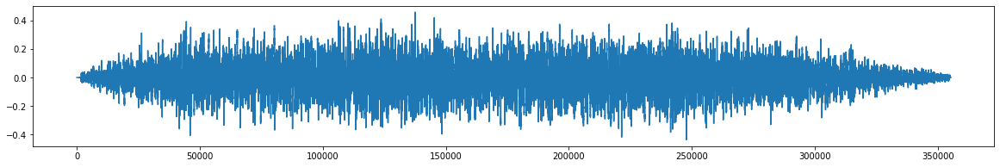

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

### Stationary remove noise

In [ ]:
n_std_thresh_stationary = 1.5
reduced_noise = nr.reduce_noise(y = data, sr=rate, n_std_thresh_stationary=n_std_thresh_stationary,stationary=True)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

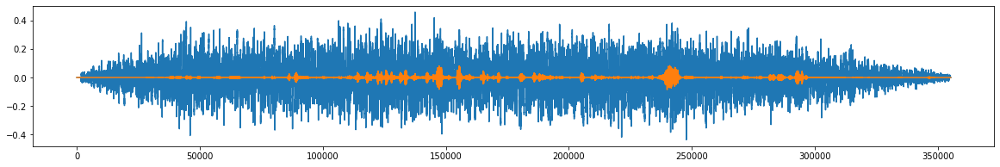

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)
ax.plot(reduced_noise)

### Non-stationary noise reduction

In [ ]:
reduced_noise = nr.reduce_noise(y=data, sr=rate, thresh_n_mult_nonstationary=n_std_thresh_stationary,stationary=False)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

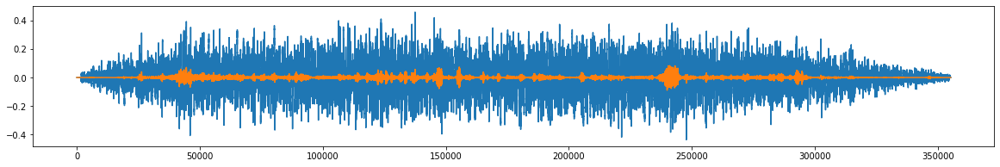

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)
ax.plot(reduced_noise)

In [ ]:
data.shape

(355265,)

## AudioUtil

https://towardsdatascience.com/audio-deep-learning-made-simple-sound-classification-step-by-step-cebc936bbe5

In [ ]:
import math, random
import torch
import torchaudio
from torchaudio import transforms
from IPython.display import Audio

class AudioUtil():
  # ----------------------------
  # Load an audio file. Return the signal as a tensor and the sample rate
  # ----------------------------
  @staticmethod
  def open(audio_file):
    sig, sr = torchaudio.load(audio_file)
    return (sig, sr)

     # ----------------------------
  # Convert the given audio to the desired number of channels
  # ----------------------------
  @staticmethod
  def rechannel(aud, new_channel):
    sig, sr = aud

    if (sig.shape[0] == new_channel):
      # Nothing to do
      return aud

    if (new_channel == 1):
      # Convert from stereo to mono by selecting only the first channel
      resig = sig[:1, :]
    else:
      # Convert from mono to stereo by duplicating the first channel
      resig = torch.cat([sig, sig])

    return ((resig, sr))


  # ----------------------------
  # Since Resample applies to a single channel, we resample one channel at a time
  # ----------------------------
  @staticmethod
  def resample(aud, newsr):
    sig, sr = aud

    if (sr == newsr):
      # Nothing to do
      return aud

    num_channels = sig.shape[0]
    # Resample first channel
    resig = torchaudio.transforms.Resample(sr, newsr)(sig[:1,:])
    if (num_channels > 1):
      # Resample the second channel and merge both channels
      retwo = torchaudio.transforms.Resample(sr, newsr)(sig[1:,:])
      resig = torch.cat([resig, retwo])

    return ((resig, newsr))

  # ----------------------------
  # Pad (or truncate) the signal to a fixed length 'max_ms' in milliseconds
  # ----------------------------
  @staticmethod
  def pad_trunc(aud, max_ms):
    sig, sr = aud
    num_rows, sig_len = sig.shape
    max_len = sr//1000 * max_ms

    if (sig_len > max_len):
      # Truncate the signal to the given length
      sig = sig[:,:max_len]

    elif (sig_len < max_len):
      # Length of padding to add at the beginning and end of the signal
      pad_begin_len = random.randint(0, max_len - sig_len)
      pad_end_len = max_len - sig_len - pad_begin_len

      # Pad with 0s
      pad_begin = torch.zeros((num_rows, pad_begin_len))
      pad_end = torch.zeros((num_rows, pad_end_len))

      sig = torch.cat((pad_begin, sig, pad_end), 1)
      
    return (sig, sr)

  # ----------------------------
  # Shifts the signal to the left or right by some percent. Values at the end
  # are 'wrapped around' to the start of the transformed signal.
  # ----------------------------
  @staticmethod
  def time_shift(aud, shift_limit):
    sig,sr = aud
    _, sig_len = sig.shape
    shift_amt = int(random.random() * shift_limit * sig_len)
    return (sig.roll(shift_amt), sr)


  # ----------------------------
  # Generate a Spectrogram
  # ----------------------------
  @staticmethod
  def spectro_gram(aud, n_mels=64, n_fft=1024, hop_len=None):
    sig,sr = aud
    top_db = 80

    # spec has shape [channel, n_mels, time], where channel is mono, stereo etc
    spec = transforms.MelSpectrogram(sr, n_fft=n_fft, hop_length=hop_len, n_mels=n_mels)(sig)

    # Convert to decibels
    spec = transforms.AmplitudeToDB(top_db=top_db)(spec)
    return (spec)


  # ----------------------------
  # Augment the Spectrogram by masking out some sections of it in both the frequency
  # dimension (ie. horizontal bars) and the time dimension (vertical bars) to prevent
  # overfitting and to help the model generalise better. The masked sections are
  # replaced with the mean value.
  # ----------------------------
  @staticmethod
  def spectro_augment(spec, max_mask_pct=0.1, n_freq_masks=1, n_time_masks=1):
    _, n_mels, n_steps = spec.shape
    mask_value = spec.mean()
    aug_spec = spec

    freq_mask_param = max_mask_pct * n_mels
    for _ in range(n_freq_masks):
      aug_spec = transforms.FrequencyMasking(freq_mask_param)(aug_spec, mask_value)

    time_mask_param = max_mask_pct * n_steps
    for _ in range(n_time_masks):
      aug_spec = transforms.TimeMasking(time_mask_param)(aug_spec, mask_value)

    return aug_spec

    

In [ ]:
data

array([ 2.76737660e-06, -3.41360760e-06, -2.08891083e-06, ...,
       -1.15470837e-04,  1.04744460e-04,  1.78034737e-04])

In [ ]:
audio_converter = AudioUtil()
audio = audio_converter.open(os.path.join(TRAIN_DATA_PATH, train_df['filename'][0]))
audio_spectrogram = audio_converter.spectro_gram(audio)

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_spectrogram[0])

## Audio To Spectrogram

https://www.kaggle.com/jirkaborovec/birdclef-convert-spectrograms-noise-reduce


birdclef-2022\train_audio\afrsil1/XC125458.ogg


C:\Users\FS\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:88: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


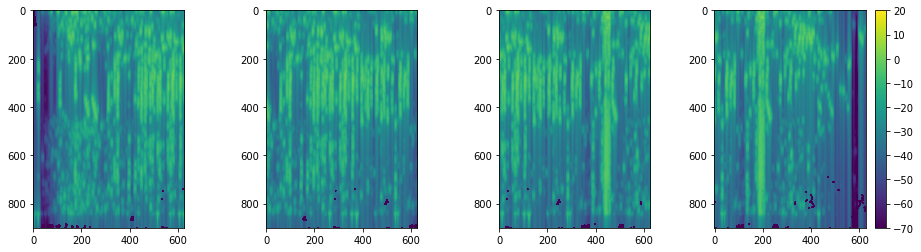

In [6]:
import torch
import torchaudio
import noisereduce as nr
import matplotlib.pyplot as plt
import numpy as np
from math import ceil
from pprint import pprint
from torch.utils.data import DataLoader


def rechannel(audio, n_channel):
    waveform, sample_rate = audio
    
    if waveform.shape[0] == n_channel:
        return audio

    if n_channel == 1:
        new_waveform = waveform[:1, :]
    else:
        new_waveform = torch.cat([waveform for _ in range(n_channel)], dim=1)
        new_waveform = new_waveform[:n_channel, :]

    return (new_waveform, sample_rate)

# @torch.no_grad()
def create_spectrogram(
    fname: str,
    reduce_noise: bool = False,
    frame_size: int = 5,
    frame_step: int = 2,
    channel: int = 0,
    device = "cpu",
    batch_size=5, 
    stationary=False,
    noise_reduce_thresh=1.5) -> list:

    waveform, sample_rate = torchaudio.load(fname)
    # print(type(waveform))     <class 'torch.Tensor'>
    # print(type(sample_rate))  <class 'int'>
    # print(waveform.shape)     torch.Size([1, 355265])
    waveform, sample_rate = rechannel((waveform, sample_rate), 1)

    transform = torchaudio.transforms.Spectrogram(n_fft=1800, win_length=512).to(device)
    if reduce_noise:
        waveform = torch.tensor(nr.reduce_noise(
            y=waveform,
            sr=sample_rate,
            win_length=transform.win_length,
            use_tqdm=False,
            n_jobs=1,
            stationary=stationary,
            n_std_thresh_stationary=noise_reduce_thresh,
            thresh_n_mult_nonstationary=noise_reduce_thresh,
        ))

    step = int(frame_step * sample_rate)
    size = int(frame_size * sample_rate)
    frames = []

    processing = True
    while processing:
        for i in range(ceil((waveform.size()[-1] - size) / step)):
            begin = i * step
            frame = waveform[channel][begin:begin + size]
            # print(frame.size())
            if len(frame) < size:
                if i == 0:
                    rep = round(float(size) / len(frame))
                    frame = frame.repeat(int(rep))
                elif len(frame) < (size * 0.33):
                    continue
                else:
                    frame = waveform[channel][-size:]
            frames.append(frame)
        if len(frames) == 0:
            new_waveform = torch.cat([waveform, waveform], dim=1)
            # print(f"Too short audio for: {fname}")
            # print(f"Use padding to have size from {waveform.shape} to {new_waveform.shape}")
            waveform = new_waveform

            # return []
        else:
            processing = False

    dl = DataLoader(frames, batch_size=batch_size)
    spectrograms = []
    for batch in dl:
        sgs = torch.log(transform(torch.tensor(batch, device=device))).cpu()
        spectrograms += [np.nan_to_num(sgs.numpy())[i, ...] for i in range(sgs.shape[0])]
    return spectrograms


# ----------------------------
# Testing
# ----------------------------

path_audio = os.path.join(TRAIN_DATA_PATH, train_df['filename'][0])
print(path_audio)
sgs = create_spectrogram(path_audio, reduce_noise=True, batch_size=2, stationary=False, noise_reduce_thresh=3)


fig, axarr = plt.subplots(ncols=len(sgs), figsize=(4 * len(sgs), 4))
for i, sg in enumerate(sgs):
    ax = axarr[i].imshow(sg, vmin=-70, vmax=20)
plt.colorbar(ax)

In [7]:
from tqdm.auto import tqdm
# from functools import partial
# from joblib import Parallel, delayed
import json

img_extension = ".jpg"


def convert_and_export(
    fn: str, path_in: str, path_out: str,
    reduce_noise: bool = False,
    stationary = False,
    noise_reduce_thresh = 2,
    frame_size: int = 5, frame_step: int = 2,
    device = "cpu",
    batch_size=2, 
    processing_state_json=None) -> None:
    
    if '/' in fn:
        label, file = fn.split('/')
        fn = os.path.join(label, file)

    path_audio = os.path.join(path_in, fn)

    if processing_state_json is not None:
        with open(os.path.join(path_out, processing_state_json), 'r') as json_file:
            processing_state = json.load(json_file)
            if processing_state.get(fn, False) == True:
                # print(f"Skip file: {path_audio}")
                # print("###########")
                return

    try:
        sgs = create_spectrogram(
            path_audio,
            reduce_noise=reduce_noise,
            frame_size=frame_size,
            frame_step=frame_step,
            device=device,
            batch_size=batch_size,
            stationary=stationary,
            noise_reduce_thresh=noise_reduce_thresh,
        )
    except Exception as ex:
        print(f"Failed conversion for audio: {path_audio}")
        print(ex)
        print("###########")
        return
    if not sgs:
        print(f"Too short audio for: {path_audio}")
        print("###########")
        return
    # see: https://www.kaggle.com/c/birdclef-2022/discussion/308861
    # this is adjustment for window 5s and step 2s
    nb = ceil((10 - frame_size) / frame_step) + 1
    if len(sgs) > 2 * nb:
        sgs = sgs[:nb] + sgs[-nb:]
    for i, sg in enumerate(sgs):
        path_img = os.path.join(path_out, fn + f".{i:03}" + img_extension)
        os.makedirs(os.path.dirname(path_img), exist_ok=True)
        try:
            plt.imsave(path_img, sg, vmin=-70, vmax=20)
        except Exception as ex:
            print(f"Failed exporting for image: {path_img}")
            print("###########")
            continue

    if processing_state_json is not None:
        processing_state[fn] = True
        # print(f"Done: {path_img}")
        # # print("###########")
        with open(os.path.join(path_out, processing_state_json), 'w') as json_file:
            json.dump(processing_state, json_file)



Setting noise_reduce_thresh here

In [8]:
import json


noise_reduce_thresh = 2
PATH_OUT = os.path.join(DATA_PATH, "train_images_thresh_{}".format(noise_reduce_thresh))
print(PATH_OUT)
if not os.path.exists(PATH_OUT):
    !mkdir $PATH_OUT

if not os.path.isfile(os.path.join(PATH_OUT, 'processing_state.json')):
    with open(os.path.join(PATH_OUT, 'processing_state.json'), 'w') as json_file:
        # data = json.load(json_file)
        data = dict()
        for filename in train_df['filename']:
            data[filename] = False
        
        
        # print(data)
        # json_object = json.dumps(data,) 
        # print(json_object)
        
        json.dump(data, json_file)
    print("JSON file created")
    
else:
    print("JSON file exists")


birdclef-2022\train_images_thresh_2
JSON file exists


In [10]:
# with open(os.path.join(PATH_OUT, 'processing_state.json'), 'r') as json_file:
#     processing_state = json.load(json_file)

from tqdm.notebook import tqdm

# _convert_and_export = partial(
#     convert_and_export,
#     path_in=TRAIN_DATA_PATH,
#     path_out=PATH_OUT,
#     reduce_noise=True,
#     noise_reduce_thresh=noise_reduce_thresh,
#     device="cuda" if torch.cuda.is_available() else "cpu",
#     batch_size=3 if torch.cuda.is_available() else 1,
#     processing_state_json='processing_state.json'
# )



for fn in tqdm(train_df["filename"], position=0, leave=False):
    convert_and_export(fn=fn, 
                       path_in=TRAIN_DATA_PATH,
                       path_out=PATH_OUT,
                       reduce_noise=True,
                       stationary=False,
                       noise_reduce_thresh=noise_reduce_thresh,
                       device="cuda" if torch.cuda.is_available() else "cpu",
                       batch_size=3 if torch.cuda.is_available() else 1,
                       processing_state_json='processing_state.json')

# _= Parallel(n_jobs=1)(delayed(_convert_and_export)(fn) for fn in tqdm(train_df["filename"]))

  0%|          | 0/14852 [00:00<?, ?it/s]

In [ ]:
# # train_df['ProcessingState'] = [False for i in range(len(train_df))]

# train_df.loc[train_df['filename'] == 'afrsil1/XC125458.ogg']['ProcessingState']
# train_df.to_csv(os.path.join(DATA_PATH, 'processing_state.csv'))

# _= Parallel(n_jobs=3)(delayed(_convert_and_export)(fn) for fn in tqdm(train_df["filename"]))

## Data loader

In [ ]:
from torch.utils.data import DataLoader, Dataset, random_split
import torchaudio

# ----------------------------
# Sound Dataset
# ----------------------------
class SoundDS(Dataset):
  def __init__(self, df, data_path):
    self.df = df
    self.data_path = str(data_path)
    self.duration = 4000
    self.sr = 44100
    self.channel = 2
    self.shift_pct = 0.4
            
  # ----------------------------
  # Number of items in dataset
  # ----------------------------
  def __len__(self):
    return len(self.df)    
    
  # ----------------------------
  # Get i'th item in dataset
  # ----------------------------
  def __getitem__(self, idx):
    # Absolute file path of the audio file - concatenate the audio directory with
    # the relative path
    audio_file = self.data_path + self.df.loc[idx, 'relative_path']
    # Get the Class ID
    class_id = self.df.loc[idx, 'classID']

    aud = AudioUtil.open(audio_file)
    # Some sounds have a higher sample rate, or fewer channels compared to the
    # majority. So make all sounds have the same number of channels and same 
    # sample rate. Unless the sample rate is the same, the pad_trunc will still
    # result in arrays of different lengths, even though the sound duration is
    # the same.
    reaud = AudioUtil.resample(aud, self.sr)
    rechan = AudioUtil.rechannel(reaud, self.channel)

    dur_aud = AudioUtil.pad_trunc(rechan, self.duration)
    shift_aud = AudioUtil.time_shift(dur_aud, self.shift_pct)
    sgram = AudioUtil.spectro_gram(shift_aud, n_mels=64, n_fft=1024, hop_len=None)
    aug_sgram = AudioUtil.spectro_augment(sgram, max_mask_pct=0.1, n_freq_masks=2, n_time_masks=2)

    return aug_sgram, class_id

In [ ]:
from torch.utils.data import random_split

myds = SoundDS(df, data_path)

# Random split of 80:20 between training and validation
num_items = len(myds)
num_train = round(num_items * 0.8)
num_val = num_items - num_train
train_ds, val_ds = random_split(myds, [num_train, num_val])

# Create training and validation data loaders
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=16, shuffle=True)
val_dl = torch.utils.data.DataLoader(val_ds, batch_size=16, shuffle=False)